# EditShield — LFW Faces Experiment Notebook

**Paper:** *EditShield: Protecting Unauthorized Image Editing by Instruction-guided Diffusion Models* (Chen et al., 2024)

**What this notebook does:**
1. Samples `N_FACE_SAMPLES` (default 50) LFW portrait images from Drive
2. Adds imperceptible adversarial noise via VAE-latent-space poisoning
3. Verifies protection: InstructPix2Pix fails to apply face-edit instructions
4. Measures protection quality with CLIP image similarity

**Dataset:** LFW portraits from `/content/drive/MyDrive/fawkes/data/lfw`  
**Outputs:** saved under `EditShield/outputs/faces_lfw_50/` — separate from MagicBrush outputs  
**Runtime requirement:** GPU (T4 minimum, A100 recommended)

**Before running:** `Runtime → Change runtime type → T4 GPU`

---
## 0. GPU Check & Google Drive Mount
Models are saved to Drive so they survive session resets.

In [1]:
import torch

assert torch.cuda.is_available(), "No GPU found — change runtime to GPU first."
print(f"GPU   : {torch.cuda.get_device_name(0)}")
print(f"CUDA  : {torch.version.cuda}")
print(f"VRAM  : {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB")
print(f"Torch : {torch.__version__}")

GPU   : NVIDIA A100-SXM4-40GB
CUDA  : 12.8
VRAM  : 42.4 GB
Torch : 2.11.0+cu128


In [2]:
from google.colab import drive
drive.mount('/content/drive')

import os

# ── Persistent roots ──────────────────────────────────────────────────────────
DRIVE_ROOT = '/content/drive/MyDrive/EditShield'
MODEL_DIR  = f'{DRIVE_ROOT}/models'
CLIP_DIR   = f'{DRIVE_ROOT}/clip'

# ── LFW experiment config ─────────────────────────────────────────────────────
USE_LFW        = True
LFW_ROOT       = '/content/drive/MyDrive/fawkes/data/lfw'
N_FACE_SAMPLES = 50
RANDOM_SEED    = 33

DATA_DIR = f'{DRIVE_ROOT}/lfw_train_data'        # LFW staging — separate from MagicBrush train_data
OUT_DIR  = f'{DRIVE_ROOT}/outputs/faces_lfw_50'  # LFW outputs — separate from MagicBrush outputs

for d in [DRIVE_ROOT, MODEL_DIR, CLIP_DIR, DATA_DIR, OUT_DIR]:
    os.makedirs(d, exist_ok=True)

print("Drive mounted. Persistent root:", DRIVE_ROOT)
print(f"LFW source  : {LFW_ROOT}")
print(f"LFW staging : {DATA_DIR}")
print(f"Output dir  : {OUT_DIR}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Drive mounted. Persistent root: /content/drive/MyDrive/EditShield
LFW source  : /content/drive/MyDrive/fawkes/data/lfw
LFW staging : /content/drive/MyDrive/EditShield/lfw_train_data
Output dir  : /content/drive/MyDrive/EditShield/outputs/faces_lfw_50


---
## 1. Install Dependencies
Run once. Skip on subsequent sessions if Drive cache is warm.

In [3]:
%%bash
# diffusers==0.25 used `cached_download` which huggingface_hub>=0.23 removed.
# Use diffusers>=0.30 which dropped that call entirely.
pip install -q \
  "diffusers>=0.30.0" \
  "transformers>=4.40.0" \
  "accelerate>=0.30.0" \
  "huggingface_hub>=0.23.0" \
  einops omegaconf kornia \
  scipy pandas seaborn matplotlib tqdm

# OpenAI CLIP
pip install -q git+https://github.com/openai/CLIP.git

# Invisible watermark (required by some diffusers pipelines)
pip install -q invisible-watermark

echo "Done — RESTART RUNTIME NOW: Runtime → Restart session, then continue from cell 0."

Done — RESTART RUNTIME NOW: Runtime → Restart session, then continue from cell 0.


---
## 2. Download Models

Models are cached to Drive. The download is skipped automatically on re-runs.

In [4]:
from huggingface_hub import list_repo_files

files = list(list_repo_files("osunlp/InstructPix2Pix-MagicBrush"))
print("Files in repo:")
for f in files:
    print(" ", f)


Files in repo:
  .gitattributes
  MagicBrush-epoch-000168.ckpt
  MagicBrush-epoch-52-step-4999.ckpt
  README.md


In [5]:
from diffusers import StableDiffusionInstructPix2PixPipeline
from huggingface_hub import hf_hub_download

MB_REPO_ID   = "osunlp/InstructPix2Pix-MagicBrush"
MB_FILENAME  = "MagicBrush-epoch-52-step-4999.ckpt"   # ← update if filename differs
IP2P_CACHE   = f'{MODEL_DIR}/ip2p_mb'

# Keep base ip2p for VAE/scheduler (identical VAE — mb only fine-tunes the UNet)
IP2P_MODEL_ID   = 'timbrooks/instruct-pix2pix'
IP2P_BASE_CACHE = f'{MODEL_DIR}/ip2p'

print(f"Downloading {MB_FILENAME} (~5 GB)...")
local_ckpt = hf_hub_download(
    repo_id=MB_REPO_ID,
    filename=MB_FILENAME,
    cache_dir=IP2P_CACHE,
)
print("Downloaded to:", local_ckpt)

# Quick test load (free VRAM after)
_pipe = StableDiffusionInstructPix2PixPipeline.from_single_file(
    local_ckpt,
    torch_dtype=torch.bfloat16,
    safety_checker=None,
)
del _pipe
print("Done.")


Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.


Downloaded to: /content/drive/MyDrive/EditShield/models/ip2p_mb/models--osunlp--InstructPix2Pix-MagicBrush/snapshots/628a7ed05dbb1668b1180ed00e2211d660b0e1f3/MagicBrush-epoch-52-step-4999.ckpt


Fetching 11 files:   0%|          | 0/11 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

In this conversion only the non-EMA weights are extracted. If you want to instead extract the EMA weights (usually better for inference), please make sure to add the `--extract_ema` flag.


Done.


In [6]:
# ── 2b. CLIP ViT-L/14 weights ─────────────────────────────────────────────────
# ~890 MB — cached to Drive

import clip, urllib.request

CLIP_WEIGHT_PATH = f'{CLIP_DIR}/ViT-L-14.pt'

if not os.path.exists(CLIP_WEIGHT_PATH):
    print("Downloading CLIP ViT-L/14 (~890 MB)...")
    # clip.load() auto-downloads; we point it at our Drive folder
    clip.load('ViT-L/14', device='cpu', download_root=CLIP_DIR)
    # The file lands as ViT-L-14.pt
    print("Saved to", CLIP_DIR)
else:
    print("CLIP weights already in Drive.")

CLIP weights already in Drive.


---
## 3. Prepare LFW Face Data

Scans `LFW_ROOT` for portrait images, randomly samples `N_FACE_SAMPLES` (default 50)
with seed `RANDOM_SEED`, and writes them into the standard data layout with face-edit prompts.

Expected layout after running the cell below:
```text
lfw_train_data/
  face_000/
    face_000_0.jpg
    prompt.json       ← {"edit": "make the person smile"}
  face_001/
    ...
```

**Resume-safe:** already-written samples are skipped automatically.

In [7]:
import json, random
from pathlib import Path
from PIL import Image

FACE_PROMPTS = [
    "make the person smile",
    "change the hair color to blonde",
    "make the person look older",
    "add dramatic makeup",
    "turn the portrait into a studio headshot",
]

SELECTED_LFW_JSON = os.path.join(
    DRIVE_ROOT,
    f"selected_lfw_faces_seed{RANDOM_SEED}_n{N_FACE_SAMPLES}.json"
)

# ── 1. Load cached selection if it already exists ─────────────────────────────
if os.path.exists(SELECTED_LFW_JSON):
    with open(SELECTED_LFW_JSON, "r") as f:
        sampled = json.load(f)

    existing_sampled = [p for p in sampled if os.path.exists(p)]
    if len(existing_sampled) >= N_FACE_SAMPLES:
        sampled = existing_sampled[:N_FACE_SAMPLES]
        print(f"Loaded cached LFW selection: {len(sampled)} images")
    else:
        print(
            f"Cached selection only has {len(existing_sampled)} existing files; "
            "rescanning LFW."
        )
        sampled = None
else:
    sampled = None

# ── 2. Fast scan: shuffle first, validate only until enough images are found ──
if sampled is None:
    all_images = []
    for ext in ("*.jpg", "*.jpeg", "*.png", "*.JPG", "*.JPEG", "*.PNG"):
        all_images.extend(Path(LFW_ROOT).rglob(ext))

    print(f"Found {len(all_images)} candidate image files under {LFW_ROOT}")
    assert len(all_images) > 0, f"No images found under {LFW_ROOT}"

    rng = random.Random(RANDOM_SEED)
    rng.shuffle(all_images)

    sampled = []
    checked = 0

    for p in all_images:
        checked += 1
        try:
            with Image.open(p) as img:
                img = img.convert("RGB")
                img.load()  # actually reads image bytes; catches many corrupt files
            sampled.append(str(p))

            if len(sampled) >= N_FACE_SAMPLES:
                break
        except Exception:
            continue

    print(f"Checked {checked} files to find {len(sampled)} valid images")
    assert len(sampled) >= N_FACE_SAMPLES, (
        f"Need {N_FACE_SAMPLES} valid images, found {len(sampled)}"
    )

    sampled = sampled[:N_FACE_SAMPLES]

    with open(SELECTED_LFW_JSON, "w") as f:
        json.dump(sampled, f, indent=2)

    print(f"Cached selected image list to: {SELECTED_LFW_JSON}")

# ── 3. Write to DATA_DIR with expected layout ─────────────────────────────────
written = skipped = refreshed = 0

for idx, src_path in enumerate(sampled):
    sample_id = f"face_{idx:03d}"
    folder    = os.path.join(DATA_DIR, sample_id)
    img_out   = os.path.join(folder, f"{sample_id}_0.jpg")
    json_out  = os.path.join(folder, "prompt.json")
    meta_out  = os.path.join(folder, "source.json")

    prompt = FACE_PROMPTS[idx % len(FACE_PROMPTS)]

    os.makedirs(folder, exist_ok=True)

    # Skip only if all expected files exist and point to the same source.
    can_skip = False
    if os.path.exists(img_out) and os.path.exists(json_out) and os.path.exists(meta_out):
        try:
            with open(meta_out, "r") as f:
                meta = json.load(f)
            can_skip = meta.get("source_path") == src_path
        except Exception:
            can_skip = False

    if can_skip:
        skipped += 1
        continue

    with Image.open(src_path) as img:
        img = img.convert("RGB")
        img.save(img_out, quality=95)

    with open(json_out, "w") as f:
        json.dump({"edit": prompt}, f, indent=2)

    with open(meta_out, "w") as f:
        json.dump(
            {
                "source_path": src_path,
                "sample_id": sample_id,
                "prompt": prompt,
                "random_seed": RANDOM_SEED,
            },
            f,
            indent=2,
        )

    if os.path.exists(img_out):
        refreshed += 1
    else:
        written += 1

print(f"Written/refreshed: {refreshed}  |  Skipped unchanged: {skipped}")
print(f"Selected samples : {len(sampled)}")
print(f"Total folders in DATA_DIR: {len(os.listdir(DATA_DIR))}")
print(f"Selection cache  : {SELECTED_LFW_JSON}")

Loaded cached LFW selection: 50 images
Written/refreshed: 0  |  Skipped unchanged: 50
Selected samples : 50
Total folders in DATA_DIR: 50
Selection cache  : /content/drive/MyDrive/EditShield/selected_lfw_faces_seed33_n50.json


In [8]:
# LFW experiment config summary — printed for reference
print("=== LFW Experiment Configuration ===")
print(f"  LFW source       : {LFW_ROOT}")
print(f"  Samples          : {N_FACE_SAMPLES}")
print(f"  Random seed      : {RANDOM_SEED}")
print(f"  Staging dir      : {DATA_DIR}")
print(f"  Output dir       : {OUT_DIR}")

=== LFW Experiment Configuration ===
  LFW source       : /content/drive/MyDrive/fawkes/data/lfw
  Samples          : 50
  Random seed      : 33
  Staging dir      : /content/drive/MyDrive/EditShield/lfw_train_data
  Output dir       : /content/drive/MyDrive/EditShield/outputs/faces_lfw_50


In [9]:
# ── Verify LFW data layout ────────────────────────────────────────────────────
import json

lfw_samples = sorted(os.listdir(DATA_DIR))
print(f"Total LFW samples staged: {len(lfw_samples)}")

for s in lfw_samples[:3]:
    p    = os.path.join(DATA_DIR, s)
    imgs = [f for f in os.listdir(p) if f.endswith('_0.jpg')]
    with open(os.path.join(p, 'prompt.json')) as f:
        prompt = json.load(f)['edit']
    print(f"  {s}: image={imgs[0]}, instruction='{prompt}'")

Total LFW samples staged: 50
  face_000: image=face_000_0.jpg, instruction='make the person smile'
  face_001: image=face_001_0.jpg, instruction='change the hair color to blonde'
  face_002: image=face_002_0.jpg, instruction='make the person look older'


---
## 4. Core Utilities

Self-contained re-implementation of `Functions.py` with Colab fixes:
- GPU device forced to `cuda:0`  
- `local_files_only=False` (auto-uses Drive cache)  
- `revision='fp16'` replaced with `torch_dtype=torch.float16`

In [10]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import transforms
from diffusers import AutoencoderKL, DDPMScheduler, UNet2DConditionModel
from transformers import AutoTokenizer, CLIPTextModel
from PIL import Image
import clip
from einops import rearrange

DEVICE = torch.device('cuda:0')

# ── Image loader ──────────────────────────────────────────────────────────────
def load_image_tensor(path: str, size: int = 512) -> torch.Tensor:
    """Loads a single image as a [1, 3, H, W] float tensor in [0, 1]."""
    tf = transforms.Compose([
        transforms.Resize(size, interpolation=transforms.InterpolationMode.BILINEAR),
        transforms.CenterCrop(size),
        transforms.ToTensor(),
    ])
    img = Image.open(path).convert('RGB')
    return tf(img).unsqueeze(0)   # [1, 3, 512, 512]


# ── Load VAE (used to compute latent embedding) ───────────────────────────────
print("Loading VAE...")
vae = AutoencoderKL.from_pretrained(
    IP2P_MODEL_ID,
    subfolder='vae',
    cache_dir=IP2P_CACHE,
    torch_dtype=torch.bfloat16,
).to(DEVICE)
vae.requires_grad_(False)

noise_scheduler = DDPMScheduler.from_pretrained(
    IP2P_MODEL_ID,
    subfolder='scheduler',
    cache_dir=IP2P_CACHE,
)

print("VAE ready.")


# ── Latent embedding function (matches paper Eq. 4) ──────────────────────────
def get_emb(img: torch.Tensor) -> torch.Tensor:
    """
    Encodes img ([B,3,H,W] in [0,1]) into a noisy latent + original-image
    embedding, concatenated channel-wise. This is what the paper calls E(x).
    """
    img_half = img.to(DEVICE, dtype=torch.bfloat16)
    latents = vae.encode(img_half).latent_dist.sample() * vae.config.scaling_factor
    noise = torch.randn_like(latents)
    bsz = latents.shape[0]
    t = torch.randint(0, noise_scheduler.config.num_train_timesteps, (bsz,), device=DEVICE).long()
    noisy = noise_scheduler.add_noise(latents, noise, t)
    img_emb = vae.encode(img_half).latent_dist.sample()
    return torch.cat([noisy, img_emb], dim=1)   # [B, 8, H/8, W/8]


# ── CLIP similarity helper ────────────────────────────────────────────────────
class ClipSimilarity(nn.Module):
    def __init__(self):
        super().__init__()
        model, _ = clip.load(CLIP_WEIGHT_PATH, device='cpu')
        self.model = model.eval().requires_grad_(False)
        self.size = 224
        self.register_buffer('mean', torch.tensor((0.48145466, 0.4578275, 0.40821073)))
        self.register_buffer('std',  torch.tensor((0.26862954, 0.26130258, 0.27577711)))

    def encode_image(self, image: torch.Tensor) -> torch.Tensor:
        image = F.interpolate(image.float(), size=self.size, mode='bicubic', align_corners=False)
        image = (image - rearrange(self.mean, 'c -> 1 c 1 1')) / rearrange(self.std, 'c -> 1 c 1 1')
        feat = self.model.encode_image(image)
        return feat / feat.norm(dim=1, keepdim=True)

    def encode_text(self, text: list) -> torch.Tensor:
        tokens = clip.tokenize(text, truncate=True).to(next(self.parameters()).device)
        feat = self.model.encode_text(tokens)
        return feat / feat.norm(dim=1, keepdim=True)


print("Core utilities defined.")

Loading VAE...


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_validators.py:205: UserWarning: The `local_dir_use_symlinks` argument is deprecated and ignored in `hf_hub_download`. Downloading to a local directory does not use symlinks anymore.
  warnings.warn(


VAE ready.
Core utilities defined.


---
## 5. Load InstructPix2Pix Pipeline

In [22]:
from diffusers import StableDiffusionInstructPix2PixPipeline, EulerAncestralDiscreteScheduler

pipe = StableDiffusionInstructPix2PixPipeline.from_single_file(
    local_ckpt,          # ← local path, not URL
    torch_dtype=torch.bfloat16,
    safety_checker=None,
).to(DEVICE)

pipe.scheduler = EulerAncestralDiscreteScheduler.from_config(pipe.scheduler.config)
pipe.set_progress_bar_config(disable=True)
print("InstructPix2Pix-MagicBrush pipeline ready.")


Fetching 11 files:   0%|          | 0/11 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

In this conversion only the non-EMA weights are extracted. If you want to instead extract the EMA weights (usually better for inference), please make sure to add the `--extract_ema` flag.


InstructPix2Pix-MagicBrush pipeline ready.


Fetching 11 files:   0%|          | 0/11 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

In this conversion only the non-EMA weights are extracted. If you want to instead extract the EMA weights (usually better for inference), please make sure to add the `--extract_ema` flag.


InstructPix2Pix-MagicBrush pipeline ready.


---
## 6. EditShield Protection

Three variants of EOT transformation. Run the one you want (or all three).

**Hyperparameters (matching the paper):**
| Paper | Code |
|---|---|
| ε = 0.05 | `PGD_EPS = 0.05` |
| β = 0.2 | `BETA = 0.2` |
| S = 100 iterations | `MAX_STEPS = 100` |

In [23]:
import numpy as np
import matplotlib.pyplot as plt
import json, pandas as pd
from tqdm.notebook import tqdm
from torch import optim

# ── Shared hyperparameters ────────────────────────────────────────────────────
PGD_EPS   = 0.05          # was 4/255 ≈ 0.016 — matches original code
MAX_STEPS = 100

BETA      = 0.2        # perceptual consistency weight (paper: 0.2)
         # PGD iterations
SEED      = 33         # fixed seed for ip2p generation
INFER_STEPS = 100      # ip2p denoising steps
IMG_GUIDANCE = 1.2     # ip2p image guidance scale
PGD_ALPHA = PGD_EPS / 10   # step size per iteration — add this near your other hyperparams


def perceptual_loss(x_perturbed: torch.Tensor, x_original: torch.Tensor) -> torch.Tensor:
    return BETA * F.mse_loss(x_perturbed, x_original)


def run_ip2p(pipe, prompt: str, image_np: np.ndarray) -> np.ndarray:
    """Runs InstructPix2Pix on a uint8 HxWx3 numpy array, returns same."""
    pil = Image.fromarray(image_np).resize((512, 512))
    gen = torch.Generator('cuda').manual_seed(SEED)
    out = pipe(prompt, image=pil, num_inference_steps=INFER_STEPS,
               image_guidance_scale=IMG_GUIDANCE, generator=gen).images[0]
    return np.array(out)


def make_output_dirs(eot_tag: str) -> dict:
    base = os.path.join(OUT_DIR, eot_tag)
    dirs = {k: os.path.join(base, k) for k in ('Ori_50', 'Adv_50', 'Gen_50', 'AdvGen_50', 'EXCEL_50')}
    for d in dirs.values():
        os.makedirs(d, exist_ok=True)
    return dirs


def optimize_perturbation(original, transform_fn):
    original = original.to(DEVICE)
    tgt_emb  = get_emb(original).detach()

    # Random init within the budget (standard PGD practice)
    delta = torch.empty_like(original).uniform_(-PGD_EPS, PGD_EPS)
    perturbed = (original + delta).clamp(0, 1).detach()

    for step in range(MAX_STEPS):
        perturbed.requires_grad_(True)

        transformed = transform_fn(perturbed)
        img_emb = get_emb(transformed)

        loss_latent = -F.mse_loss(img_emb.float(), tgt_emb.float())
        loss_percep =  perceptual_loss(perturbed, original)
        loss = loss_latent + loss_percep

        loss.backward()

        with torch.no_grad():
            # PGD step: sign of gradient × fixed step size
            perturbed = perturbed + PGD_ALPHA * perturbed.grad.sign()

            # Project back onto L∞ budget ball
            delta = (perturbed - original).clamp(-PGD_EPS, PGD_EPS)
            perturbed = (original + delta).clamp(0, 1)

        perturbed = perturbed.detach()   # detach for next iteration

    return perturbed



def clip_image_sim(clip_model, img_a: torch.Tensor, img_b: torch.Tensor) -> float:
    f_a = clip_model.encode_image(img_a)
    f_b = clip_model.encode_image(img_b)
    return F.cosine_similarity(f_a, f_b).item()


print("Protection utilities defined.")

Protection utilities defined.
Protection utilities defined.


### 6a. EOT-Center (center-crop transformation)

In [24]:
BASELINE_DIR = os.path.join(OUT_DIR, "Baseline_Gen_50")
os.makedirs(BASELINE_DIR, exist_ok=True)

def get_or_create_baseline(sample_id, img_fname, prompt, x_np):
    sample_dir = os.path.join(BASELINE_DIR, sample_id)
    os.makedirs(sample_dir, exist_ok=True)
    gen_path = os.path.join(sample_dir, img_fname)

    if os.path.exists(gen_path):
        return np.array(Image.open(gen_path).convert("RGB"))

    gen_np = run_ip2p(pipe, prompt, x_np)
    Image.fromarray(gen_np).save(gen_path)
    return gen_np

In [25]:
import torchvision.transforms.functional as TF

EOT_TAG    = 'EOT-C'
CROP_RATIO = 0.9

def center_crop_transform(x: torch.Tensor) -> torch.Tensor:
    _, _, H, W = x.shape
    h, w = int(H * CROP_RATIO), int(W * CROP_RATIO)
    cropped = TF.center_crop(x, [h, w])
    return F.interpolate(cropped, size=(H, W), mode='bilinear', align_corners=False)


clip_model = ClipSimilarity().to(DEVICE)
dirs       = make_output_dirs(EOT_TAG)
samples    = sorted(os.listdir(DATA_DIR))[:N_FACE_SAMPLES]
print(f"Processing {len(samples)} LFW samples — {EOT_TAG}")

# ── Resume: load any already-completed rows ───────────────────────────────────
excel_path = os.path.join(dirs['EXCEL_50'], 'result.csv')
if os.path.exists(excel_path):
    _existing    = pd.read_csv(excel_path)
    records      = _existing.to_dict('records')
    done_samples = set(_existing['sample'].tolist())
    print(f"Resuming: {len(done_samples)} samples already done.")
else:
    records      = []
    done_samples = set()

for sample_id in tqdm(samples, desc=EOT_TAG):
    if sample_id in done_samples:
        continue

    sample_path = os.path.join(DATA_DIR, sample_id)
    img_files   = sorted(f for f in os.listdir(sample_path) if f.endswith('_0.jpg'))
    if not img_files:
        continue

    with open(os.path.join(sample_path, 'prompt.json')) as f:
        prompt = json.load(f)['edit']

    for img_fname in img_files:
        img_path = os.path.join(sample_path, img_fname)

        x    = load_image_tensor(img_path).to(DEVICE)
        x_np = (x[0].permute(1,2,0).cpu().numpy() * 255).astype(np.uint8)

        gen_np = get_or_create_baseline(sample_id, img_fname, prompt, x_np)
        x_adv     = optimize_perturbation(x, center_crop_transform)
        x_adv_np  = (x_adv[0].cpu().permute(1,2,0).clamp(0,1).numpy() * 255).astype(np.uint8)
        advgen_np = run_ip2p(pipe, prompt, x_adv_np)

        for sub in ('Ori_50', 'Gen_50', 'Adv_50', 'AdvGen_50'):
            os.makedirs(os.path.join(dirs[sub], sample_id), exist_ok=True)

        Image.fromarray(x_np).save(     os.path.join(dirs['Ori_50'],    sample_id, img_fname))
        Image.fromarray(gen_np).save(   os.path.join(dirs['Gen_50'],    sample_id, img_fname))
        Image.fromarray(x_adv_np).save( os.path.join(dirs['Adv_50'],    sample_id, img_fname))
        Image.fromarray(advgen_np).save(os.path.join(dirs['AdvGen_50'], sample_id, img_fname))

        def to_tensor(arr):
            return torch.tensor(arr.transpose(2,0,1) / 255.).float().unsqueeze(0).to(DEVICE)

        records.append({
            'sample': sample_id, 'file': img_fname, 'prompt': prompt,
            'clip_sim_no_protection':   clip_image_sim(clip_model, to_tensor(x_np), to_tensor(gen_np)),
            'clip_sim_with_protection': clip_image_sim(clip_model, to_tensor(x_np), to_tensor(advgen_np)),
            'clip_sim_adv_vs_ori':      clip_image_sim(clip_model, to_tensor(x_np), to_tensor(x_adv_np)),
        })

    # Save after each sample so a disconnected session can resume
    pd.DataFrame(records).to_csv(excel_path, index=False)

df = pd.DataFrame(records)
print(f"\nSaved {len(df)} rows to {excel_path}")
df.describe()

Processing 50 LFW samples — EOT-C


EOT-C:   0%|          | 0/50 [00:00<?, ?it/s]


Saved 50 rows to /content/drive/MyDrive/EditShield/outputs/faces_lfw_50/EOT-C/EXCEL_50/result.csv


,clip_sim_no_protection,clip_sim_with_protection,clip_sim_adv_vs_ori
count,50.000000,50.000000,50.000000
mean,0.651592,0.552092,0.885946
std,0.184444,0.149957,0.032911
min,0.203852,0.181030,0.800463
25%,0.525203,0.445236,0.866661
50%,0.662399,0.557061,0.888533
75%,0.799161,0.641015,0.913354
max,0.940269,0.857302,0.946547


Processing 50 LFW samples — EOT-C
Resuming: 50 samples already done.


EOT-C:   0%|          | 0/50 [00:00<?, ?it/s]


Saved 50 rows to /content/drive/MyDrive/EditShield/outputs/faces_lfw_50/EOT-C/EXCEL_50/result.csv


,clip_sim_no_protection,clip_sim_with_protection,clip_sim_adv_vs_ori
count,50.000000,50.000000,50.000000
mean,0.651592,0.552092,0.885946
std,0.184444,0.149957,0.032911
min,0.203852,0.181030,0.800463
25%,0.525203,0.445236,0.866661
50%,0.662399,0.557061,0.888533
75%,0.799161,0.641015,0.913354
max,0.940269,0.857302,0.946547


### 6b. EOT-Gaussian (Gaussian kernel smoothing)

In [26]:
from scipy import signal

EOT_TAG_G          = 'EOT-G'
KERNEL_SIZE, SIGMA = 5, 1.5


def make_gaussian_kernel(size: int, sigma: float) -> torch.Tensor:
    k = np.outer(signal.windows.gaussian(size, sigma), signal.windows.gaussian(size, sigma))
    return torch.tensor(k, dtype=torch.float32).unsqueeze(0).unsqueeze(0)

GAUSS_KERNEL = make_gaussian_kernel(KERNEL_SIZE, SIGMA).to(DEVICE)

def gaussian_blur_transform(x: torch.Tensor) -> torch.Tensor:
    pad = KERNEL_SIZE // 2
    channels = []
    for c in range(x.shape[1]):
        channels.append(F.conv2d(x[:, c:c+1, :, :], GAUSS_KERNEL, padding=pad))
    return torch.cat(channels, dim=1).clamp(0, 1)


def optimize_perturbation_G(original):
    """EOT-G variant: adds smoothness regularization matching the original repo."""
    original     = original.to(DEVICE)
    tgt_emb      = get_emb(original).detach()
    gaussian_ref = gaussian_blur_transform(original).detach()

    delta     = torch.empty_like(original).uniform_(-PGD_EPS, PGD_EPS)
    perturbed = (original + delta).clamp(0, 1).detach()

    for step in range(MAX_STEPS):
        perturbed.requires_grad_(True)
        img_emb     = get_emb(perturbed)
        loss_latent = -F.mse_loss(img_emb.float(), tgt_emb.float())
        loss_smooth =  F.mse_loss(gaussian_blur_transform(perturbed), gaussian_ref)
        loss_percep =  perceptual_loss(perturbed, original)
        loss = loss_latent + 0.1 * loss_smooth + loss_percep
        loss.backward()
        with torch.no_grad():
            perturbed = perturbed + PGD_ALPHA * perturbed.grad.sign()
            delta     = (perturbed - original).clamp(-PGD_EPS, PGD_EPS)
            perturbed = (original + delta).clamp(0, 1)
        perturbed = perturbed.detach()

    return perturbed


dirs_g    = make_output_dirs(EOT_TAG_G)
samples_g = sorted(os.listdir(DATA_DIR))[:N_FACE_SAMPLES]
print(f"Processing {len(samples_g)} LFW samples — {EOT_TAG_G}")

# ── Resume ────────────────────────────────────────────────────────────────────
excel_path_g = os.path.join(dirs_g['EXCEL_50'], 'result.csv')
if os.path.exists(excel_path_g):
    _ex_g     = pd.read_csv(excel_path_g)
    records_g = _ex_g.to_dict('records')
    done_g    = set(_ex_g['sample'].tolist())
    print(f"Resuming: {len(done_g)} samples already done.")
else:
    records_g = []
    done_g    = set()

for sample_id in tqdm(samples_g, desc=EOT_TAG_G):
    if sample_id in done_g:
        continue

    sample_path = os.path.join(DATA_DIR, sample_id)
    img_files   = sorted(f for f in os.listdir(sample_path) if f.endswith('_0.jpg'))
    if not img_files:
        continue

    with open(os.path.join(sample_path, 'prompt.json')) as f:
        prompt = json.load(f)['edit']

    for img_fname in img_files:
        img_path  = os.path.join(sample_path, img_fname)
        x         = load_image_tensor(img_path).to(DEVICE)
        x_np      = (x[0].permute(1,2,0).cpu().numpy() * 255).astype(np.uint8)

        gen_np = get_or_create_baseline(sample_id, img_fname, prompt, x_np)
        x_adv     = optimize_perturbation_G(x)
        x_adv_np  = (x_adv[0].cpu().permute(1,2,0).clamp(0,1).numpy() * 255).astype(np.uint8)
        advgen_np = run_ip2p(pipe, prompt, x_adv_np)

        for sub in ('Ori_50', 'Gen_50', 'Adv_50', 'AdvGen_50'):
            os.makedirs(os.path.join(dirs_g[sub], sample_id), exist_ok=True)

        Image.fromarray(x_np).save(     os.path.join(dirs_g['Ori_50'],    sample_id, img_fname))
        Image.fromarray(gen_np).save(   os.path.join(dirs_g['Gen_50'],    sample_id, img_fname))
        Image.fromarray(x_adv_np).save( os.path.join(dirs_g['Adv_50'],    sample_id, img_fname))
        Image.fromarray(advgen_np).save(os.path.join(dirs_g['AdvGen_50'], sample_id, img_fname))

        def to_t(arr):
            return torch.tensor(arr.transpose(2,0,1)/255.).float().unsqueeze(0).to(DEVICE)

        records_g.append({
            'sample': sample_id, 'file': img_fname, 'prompt': prompt,
            'clip_sim_no_protection':   clip_image_sim(clip_model, to_t(x_np), to_t(gen_np)),
            'clip_sim_with_protection': clip_image_sim(clip_model, to_t(x_np), to_t(advgen_np)),
        })

    pd.DataFrame(records_g).to_csv(excel_path_g, index=False)

df_g = pd.DataFrame(records_g)
print(f"Saved {len(df_g)} rows — {EOT_TAG_G}")
df_g.describe()

Processing 50 LFW samples — EOT-G


EOT-G:   0%|          | 0/50 [00:00<?, ?it/s]

Saved 50 rows — EOT-G


,clip_sim_no_protection,clip_sim_with_protection
count,50.000000,50.000000
mean,0.652353,0.611193
std,0.175030,0.164152
min,0.199483,0.197112
25%,0.536060,0.523434
50%,0.676055,0.596394
75%,0.781058,0.720437
max,0.934055,0.905399


Processing 50 LFW samples — EOT-G
Resuming: 50 samples already done.


EOT-G:   0%|          | 0/50 [00:00<?, ?it/s]

Saved 50 rows — EOT-G


,clip_sim_no_protection,clip_sim_with_protection
count,50.000000,50.000000
mean,0.652353,0.611193
std,0.175030,0.164152
min,0.199483,0.197112
25%,0.536060,0.523434
50%,0.676055,0.596394
75%,0.781058,0.720437
max,0.934055,0.905399


### 6c. EOT-Rotation (5° rotation)

In [27]:
EOT_TAG_R      = 'EOT-R'
ROTATION_ANGLE = 5

def rotation_transform(x: torch.Tensor) -> torch.Tensor:
    return torch.stack([TF.rotate(img, ROTATION_ANGLE) for img in x])


dirs_r    = make_output_dirs(EOT_TAG_R)
samples_r = sorted(os.listdir(DATA_DIR))[:N_FACE_SAMPLES]
print(f"Processing {len(samples_r)} LFW samples — {EOT_TAG_R}")

# ── Resume ────────────────────────────────────────────────────────────────────
excel_path_r = os.path.join(dirs_r['EXCEL_50'], 'result.csv')
if os.path.exists(excel_path_r):
    _ex_r     = pd.read_csv(excel_path_r)
    records_r = _ex_r.to_dict('records')
    done_r    = set(_ex_r['sample'].tolist())
    print(f"Resuming: {len(done_r)} samples already done.")
else:
    records_r = []
    done_r    = set()

for sample_id in tqdm(samples_r, desc=EOT_TAG_R):
    if sample_id in done_r:
        continue

    sample_path = os.path.join(DATA_DIR, sample_id)
    img_files   = sorted(f for f in os.listdir(sample_path) if f.endswith('_0.jpg'))
    if not img_files:
        continue

    with open(os.path.join(sample_path, 'prompt.json')) as f:
        prompt = json.load(f)['edit']

    for img_fname in img_files:
        img_path  = os.path.join(sample_path, img_fname)
        x         = load_image_tensor(img_path).to(DEVICE)
        x_np      = (x[0].permute(1,2,0).cpu().numpy() * 255).astype(np.uint8)

        gen_np = get_or_create_baseline(sample_id, img_fname, prompt, x_np)
        x_adv     = optimize_perturbation(x, rotation_transform)
        x_adv_np  = (x_adv[0].cpu().permute(1,2,0).clamp(0,1).numpy() * 255).astype(np.uint8)
        advgen_np = run_ip2p(pipe, prompt, x_adv_np)

        for sub in ('Ori_50', 'Gen_50', 'Adv_50', 'AdvGen_50'):
            os.makedirs(os.path.join(dirs_r[sub], sample_id), exist_ok=True)

        Image.fromarray(x_np).save(     os.path.join(dirs_r['Ori_50'],    sample_id, img_fname))
        Image.fromarray(gen_np).save(   os.path.join(dirs_r['Gen_50'],    sample_id, img_fname))
        Image.fromarray(x_adv_np).save( os.path.join(dirs_r['Adv_50'],    sample_id, img_fname))
        Image.fromarray(advgen_np).save(os.path.join(dirs_r['AdvGen_50'], sample_id, img_fname))

        def to_t(arr):
            return torch.tensor(arr.transpose(2,0,1)/255.).float().unsqueeze(0).to(DEVICE)

        records_r.append({
            'sample': sample_id, 'file': img_fname, 'prompt': prompt,
            'clip_sim_no_protection':   clip_image_sim(clip_model, to_t(x_np), to_t(gen_np)),
            'clip_sim_with_protection': clip_image_sim(clip_model, to_t(x_np), to_t(advgen_np)),
        })

    pd.DataFrame(records_r).to_csv(excel_path_r, index=False)

df_r = pd.DataFrame(records_r)
print(f"Saved {len(df_r)} rows — {EOT_TAG_R}")
df_r.describe()

Processing 50 LFW samples — EOT-R


EOT-R:   0%|          | 0/50 [00:00<?, ?it/s]

Saved 50 rows — EOT-R


,clip_sim_no_protection,clip_sim_with_protection
count,50.000000,50.000000
mean,0.652353,0.559883
std,0.175030,0.136894
min,0.199483,0.252097
25%,0.536060,0.458422
50%,0.676055,0.546340
75%,0.781058,0.660824
max,0.934055,0.831561


Processing 50 LFW samples — EOT-R
Resuming: 50 samples already done.


EOT-R:   0%|          | 0/50 [00:00<?, ?it/s]

Saved 50 rows — EOT-R


,clip_sim_no_protection,clip_sim_with_protection
count,50.000000,50.000000
mean,0.652353,0.559883
std,0.175030,0.136894
min,0.199483,0.252097
25%,0.536060,0.458422
50%,0.676055,0.546340
75%,0.781058,0.660824
max,0.934055,0.831561


---
## 7. Visual Inspection

Shows source / edited (no protection) / edited (with protection) side-by-side.

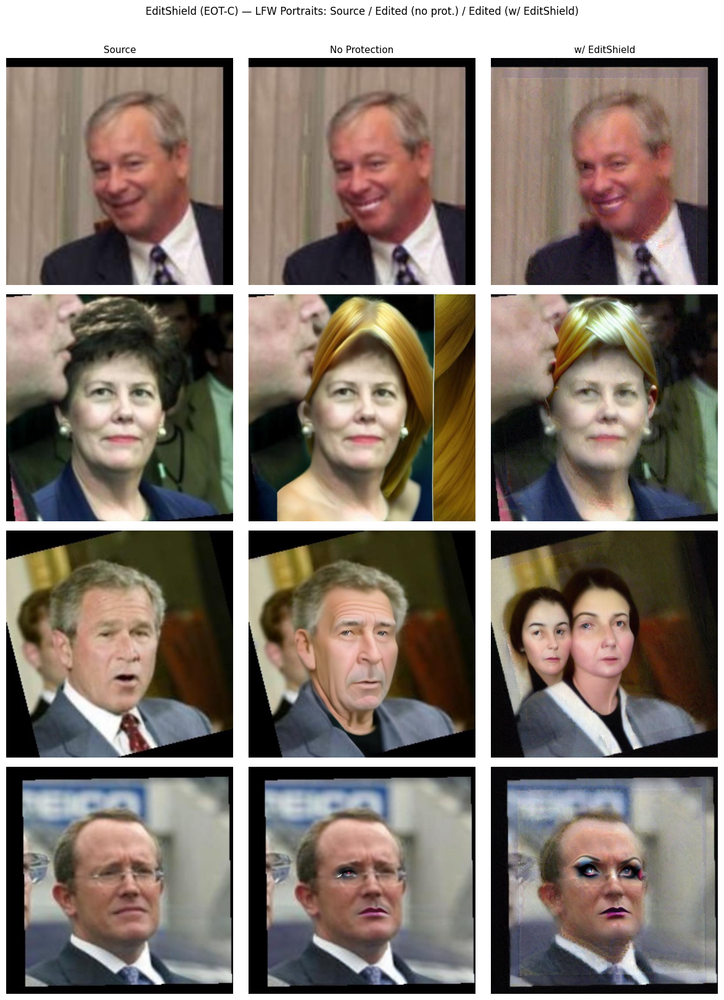

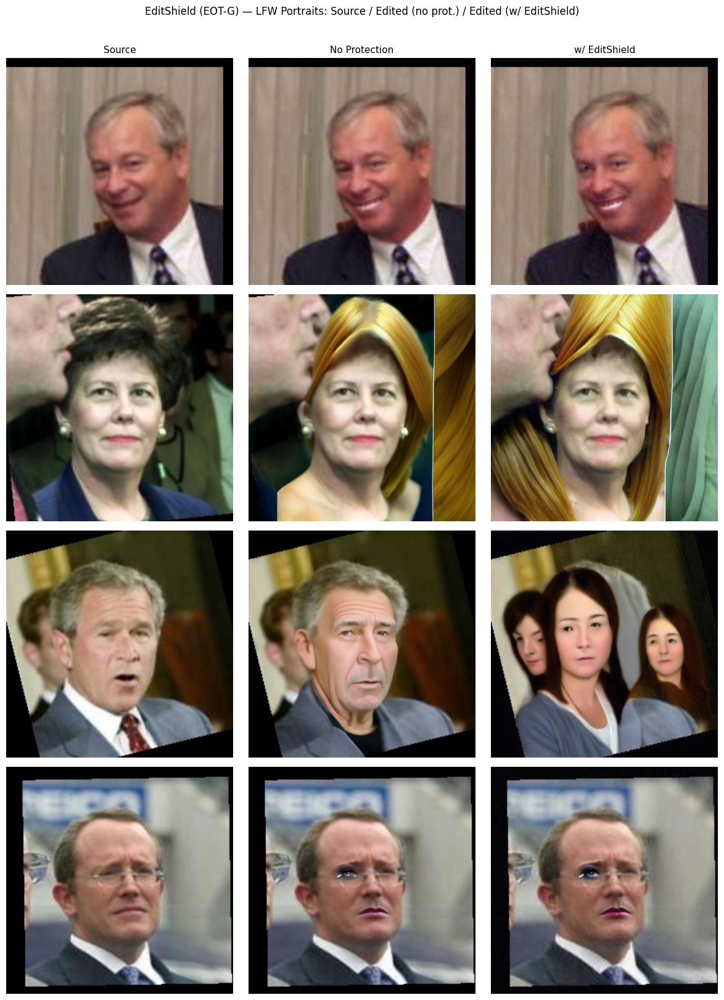

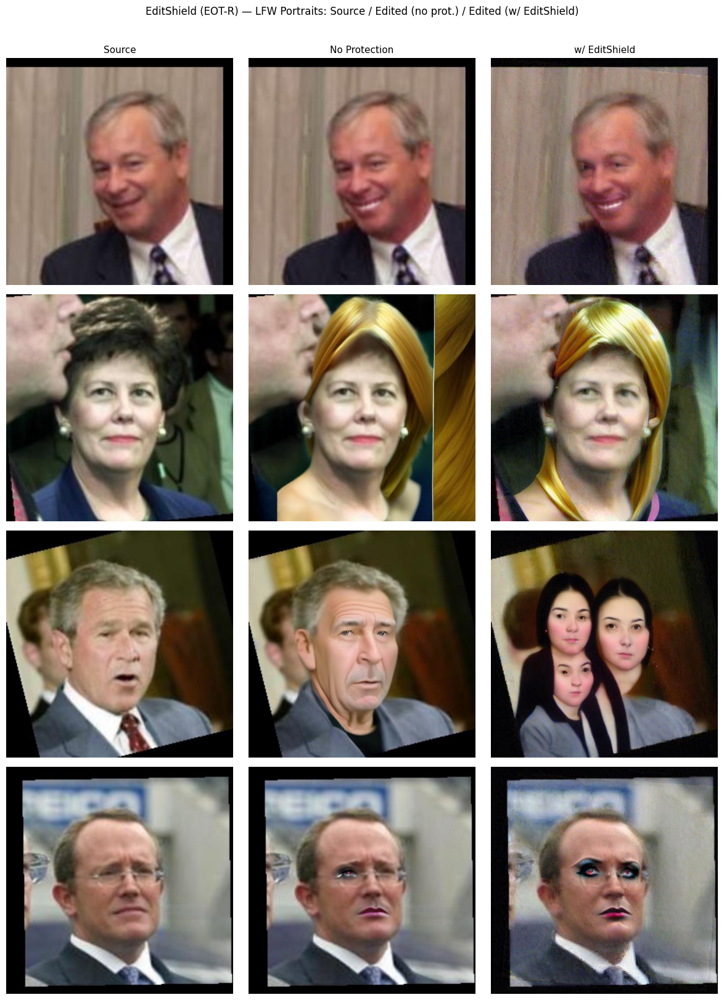

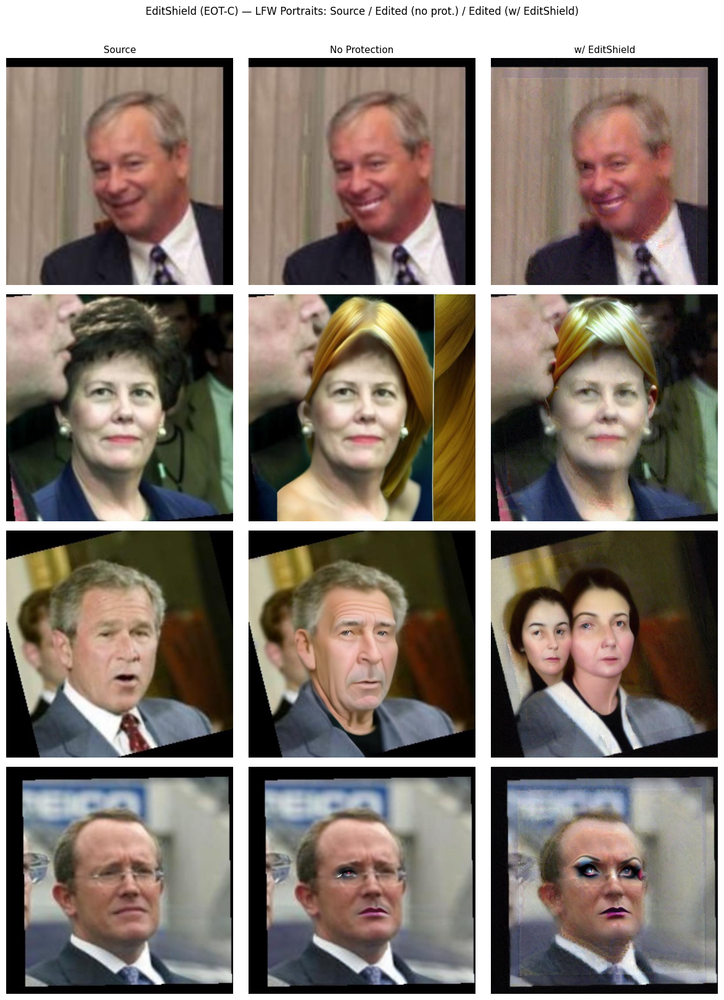

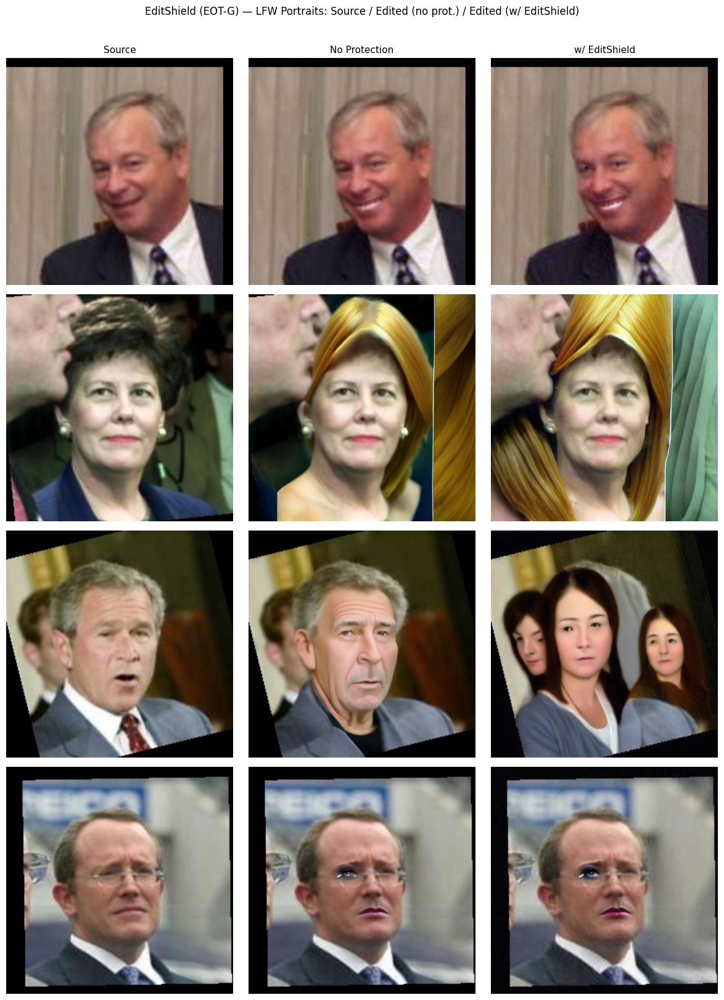

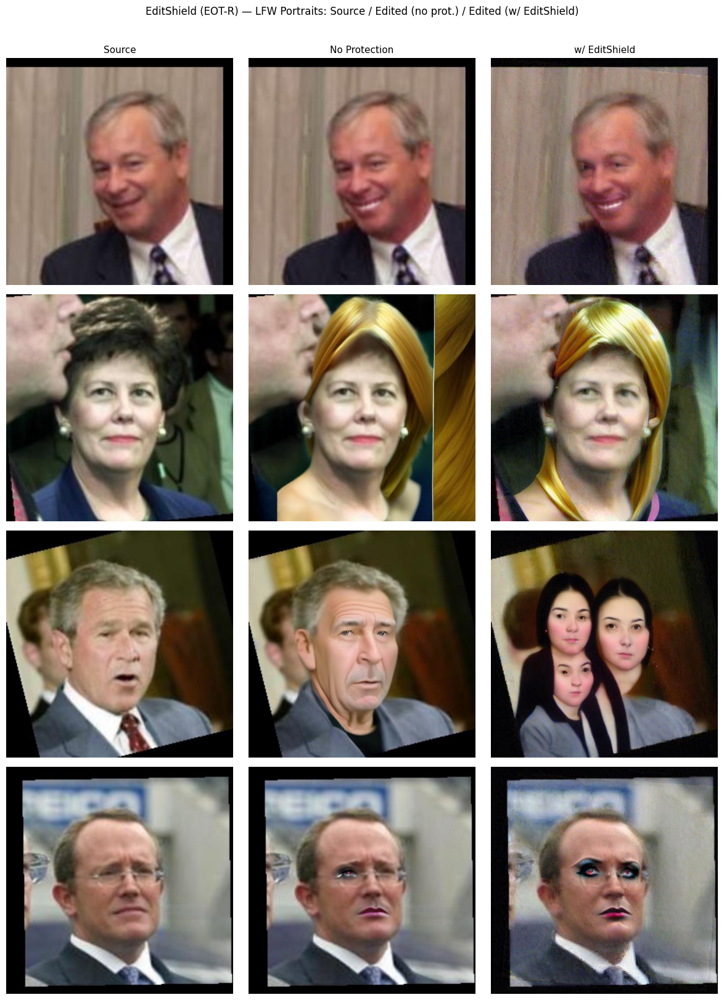

In [28]:
import matplotlib.pyplot as plt

def visualize_protection(eot_tag: str, n_samples: int = 4):
    base       = os.path.join(OUT_DIR, eot_tag)
    sample_ids = sorted(os.listdir(os.path.join(base, 'Ori_50')))[:n_samples]

    fig, axes = plt.subplots(n_samples, 3, figsize=(12, 4 * n_samples))
    fig.suptitle(
        f'EditShield ({eot_tag}) — LFW Portraits: Source / Edited (no prot.) / Edited (w/ EditShield)',
        fontsize=12, y=1.01
    )

    for row, sid in enumerate(sample_ids):
        fnames = sorted(os.listdir(os.path.join(base, 'Ori_50', sid)))
        if not fnames:
            continue
        fn = fnames[0]

        ori    = Image.open(os.path.join(base, 'Ori_50',    sid, fn))
        gen    = Image.open(os.path.join(base, 'Gen_50',    sid, fn))
        advgen = Image.open(os.path.join(base, 'AdvGen_50', sid, fn))

        for col, (img, title) in enumerate([(ori, 'Source'), (gen, 'No Protection'), (advgen, 'w/ EditShield')]):
            ax = axes[row, col] if n_samples > 1 else axes[col]
            ax.imshow(img)
            ax.axis('off')
            if row == 0:
                ax.set_title(title, fontsize=11)

    plt.tight_layout()
    plt.savefig(os.path.join(OUT_DIR, f'{eot_tag}_visual.png'), bbox_inches='tight', dpi=150)
    plt.show()

visualize_protection('EOT-C')
visualize_protection('EOT-G')
visualize_protection('EOT-R')

---
## 8. Quantitative Results

Aggregates CLIP image similarity for all three EOT variants.
Lower = worse editing = better protection (matches paper Fig. 5).

Method  CLIP sim (no prot.) ↓  CLIP sim (w/ prot.) ↓     Drop
 EOT-C               0.662399               0.557061 0.105338
 EOT-G               0.676055               0.596394 0.079661
 EOT-R               0.676055               0.546340 0.129715


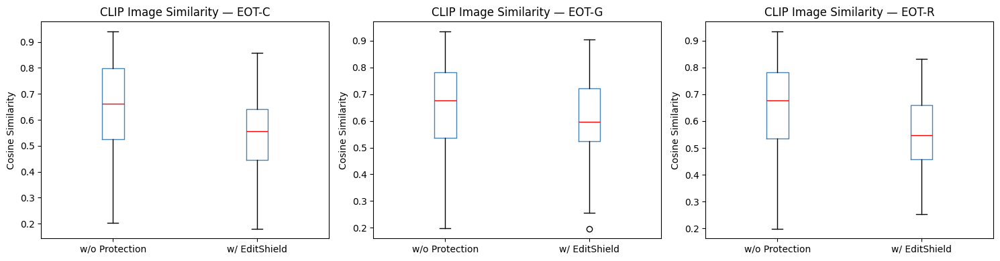

Method  CLIP sim (no prot.) ↓  CLIP sim (w/ prot.) ↓     Drop
 EOT-C               0.662399               0.557061 0.105338
 EOT-G               0.676055               0.596394 0.079661
 EOT-R               0.676055               0.546340 0.129715


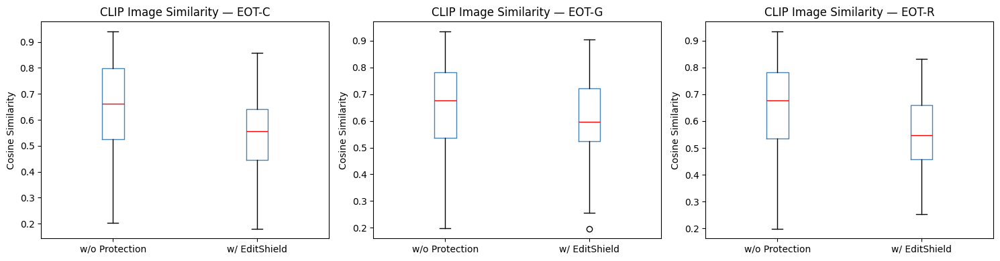

In [29]:
import seaborn as sns

results = {}
for tag in ('EOT-C', 'EOT-G', 'EOT-R'):
    csv_path = os.path.join(OUT_DIR, tag, 'EXCEL_50', 'result.csv')
    if os.path.exists(csv_path):
        results[tag] = pd.read_csv(csv_path)

if results:
    # Summary table
    rows = []
    for tag, df in results.items():
        rows.append({
            'Method': tag,
            'CLIP sim (no prot.) ↓': df['clip_sim_no_protection'].median(),
            'CLIP sim (w/ prot.) ↓': df['clip_sim_with_protection'].median(),
            'Drop': df['clip_sim_no_protection'].median() - df['clip_sim_with_protection'].median(),
        })
    print(pd.DataFrame(rows).to_string(index=False))

    # Box plot (matches paper Fig. 5 style)
    fig, axes = plt.subplots(1, len(results), figsize=(5 * len(results), 4))
    if len(results) == 1:
        axes = [axes]

    for ax, (tag, df) in zip(axes, results.items()):
        plot_data = pd.DataFrame({
            'w/o Protection': df['clip_sim_no_protection'],
            'w/ EditShield':  df['clip_sim_with_protection'],
        })
        plot_data.plot.box(ax=ax, color={'boxes': 'steelblue', 'whiskers': 'black',
                                         'medians': 'red', 'caps': 'black'})
        ax.set_title(f'CLIP Image Similarity — {tag}')
        ax.set_ylabel('Cosine Similarity')

    plt.tight_layout()
    plt.savefig(os.path.join(OUT_DIR, 'clip_similarity_boxplot.png'), dpi=150)
    plt.show()
else:
    print("No results yet — run Section 6 first.")

---
## 9. CLIP Text-Image Direction Similarity

Requires image captions. The paper uses LLaVA-1.5-13B, which needs ~26 GB VRAM
(A100 only). This cell uses a lighter captioning approach (`blip-2`) as a proxy
that runs on T4 and gives comparable directional similarity numbers.

**For exact paper reproduction:** switch to LLaVA-1.5-13B on an A100 instance.

In [30]:
# ── Install BLIP-2 captioning (T4-compatible proxy) ───────────────────────────
# !pip install -q transformers>=4.36 Pillow

from transformers import Blip2Processor, Blip2ForConditionalGeneration

BLIP_CACHE = f'{MODEL_DIR}/blip2'
print("Loading BLIP-2 captioner (~5 GB)...")
blip_processor = Blip2Processor.from_pretrained(
    'Salesforce/blip2-opt-2.7b', cache_dir=BLIP_CACHE)
blip_model = Blip2ForConditionalGeneration.from_pretrained(
    'Salesforce/blip2-opt-2.7b', cache_dir=BLIP_CACHE,
    torch_dtype=torch.float16).to(DEVICE)
blip_model.eval()
print("BLIP-2 ready.")

def caption(image_path: str) -> str:
    img = Image.open(image_path).convert('RGB')
    inputs = blip_processor(images=img, return_tensors='pt').to(DEVICE, dtype=torch.float16)
    with torch.no_grad():
        ids = blip_model.generate(**inputs, max_new_tokens=50)
    return blip_processor.decode(ids[0], skip_special_tokens=True).strip()

Loading BLIP-2 captioner (~5 GB)...


The image processor of type `BlipImageProcessor` is now loaded as a fast processor by default, even if the model checkpoint was saved with a slow processor. This is a breaking change and may produce slightly different outputs. To continue using the slow processor, instantiate this class with `use_fast=False`. 


Fetching 2 files:   0%|          | 0/2 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/1247 [00:00<?, ?it/s]

BLIP-2 ready.
Loading BLIP-2 captioner (~5 GB)...


Fetching 2 files:   0%|          | 0/2 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/1247 [00:00<?, ?it/s]

BLIP-2 ready.


In [31]:
# ── Direction similarity for EOT-C on LFW faces ───────────────────────────────

EOT_EVAL   = 'EOT-C'
base       = os.path.join(OUT_DIR, EOT_EVAL)
sample_ids = sorted(os.listdir(os.path.join(base, 'Ori_50')))[:N_FACE_SAMPLES]

dir_sim_records = []

for sid in tqdm(sample_ids, desc='Direction similarity'):
    fnames = sorted(os.listdir(os.path.join(base, 'Ori_50', sid)))
    if not fnames:
        continue
    fn = fnames[0]

    p_ori    = os.path.join(base, 'Ori_50',    sid, fn)
    p_gen    = os.path.join(base, 'Gen_50',    sid, fn)
    p_advgen = os.path.join(base, 'AdvGen_50', sid, fn)

    cap_src    = caption(p_ori)
    cap_gen    = caption(p_gen)
    cap_advgen = caption(p_advgen)

    with open(os.path.join(DATA_DIR, sid, 'prompt.json')) as f:
        instruction = json.load(f)['edit']

    def to_t(path):
        arr = np.array(Image.open(path).resize((512, 512))) / 255.
        return torch.tensor(arr.transpose(2,0,1)).float().unsqueeze(0).to(DEVICE)

    f_src    = clip_model.encode_image(to_t(p_ori))
    f_gen    = clip_model.encode_image(to_t(p_gen))
    f_advgen = clip_model.encode_image(to_t(p_advgen))

    t_src    = clip_model.encode_text([cap_src])
    t_gen    = clip_model.encode_text([cap_gen])
    t_advgen = clip_model.encode_text([cap_advgen])

    dir_bef = F.cosine_similarity(f_gen    - f_src, t_gen    - t_src).item()
    dir_aft = F.cosine_similarity(f_advgen - f_src, t_advgen - t_src).item()

    dir_sim_records.append({
        'sample': sid, 'file': fn, 'instruction': instruction,
        'direction_sim_no_prot': dir_bef,
        'direction_sim_w_prot':  dir_aft,
        'cap_src': cap_src, 'cap_gen': cap_gen, 'cap_advgen': cap_advgen,
    })

df_dir = pd.DataFrame(dir_sim_records)
df_dir.to_csv(os.path.join(base, 'EXCEL_50', 'result_direction_sim.csv'), index=False)
print(f"\nDirection similarity (median) — LFW faces:")
print(f"  No protection  : {df_dir['direction_sim_no_prot'].median():.4f}")
print(f"  w/ EditShield  : {df_dir['direction_sim_w_prot'].median():.4f}")
print(f"  Drop           : {(df_dir['direction_sim_no_prot'] - df_dir['direction_sim_w_prot']).median():.4f}")

Direction similarity:   0%|          | 0/50 [00:00<?, ?it/s]


Direction similarity (median) — LFW faces:
  No protection  : 0.1002
  w/ EditShield  : 0.1158
  Drop           : -0.0126


Direction similarity:   0%|          | 0/50 [00:00<?, ?it/s]


Direction similarity (median) — LFW faces:
  No protection  : 0.1002
  w/ EditShield  : 0.1158
  Drop           : -0.0126


---
## 10. Download All Results

Zips outputs from Drive and downloads to your machine.

In [32]:
import shutil

zip_path = f'/content/drive/MyDrive/EditShield/lfw_faces_results_50'
shutil.make_archive(zip_path, 'zip', OUT_DIR)
print("Saved to:", zip_path + '.zip')

Saved to: /content/drive/MyDrive/EditShield/lfw_faces_results_50.zip
Saved to: /content/drive/MyDrive/EditShield/lfw_faces_results_50.zip


---
## Troubleshooting

| Symptom | Fix |
|---|---|
| `ImportError: cannot import name 'cached_download'` | Re-run Section 1 (install cell now uses `diffusers>=0.30`), then **restart the runtime**. |
| `CUDA out of memory` | Restart runtime, re-run from Section 5. On T4: reduce `INFER_STEPS` to 50. |
| `RuntimeError: local_files_only=True` | Delete the `IP2P_CACHE` folder from Drive and re-run Section 2. |
| Session disconnected mid-run | All images saved to Drive per-sample — re-run skips already-saved samples if you add an `os.path.exists()` check. |
| BLIP-2 OOM on T4 | `torch.float16` already set; also try reducing image size to 384. |
| `No module named 'clip'` | Re-run Section 1, then restart runtime. |